# Library

In [1]:
# My library
from molgraph.dataset import *
from molgraph.graphmodel import *
from molgraph.training import *
from molgraph.testing import *
from molgraph.visualize import *
from molgraph.interpret import *
from molgraph.experiment import *
# General library
import argparse
import numpy as np
import os
# pytorch
import torch
import pytorch_lightning as pl

sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")

# Ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.determinstic = True
torch.backends.cudnn.benchmark = False

/opt/anaconda3/envs/moleculegraph38/lib/python3.8/site-packages/openbabel/__init__.py:14: UserWarning: "import openbabel" is deprecated, instead use "from openbabel import openbabel"
  warnings.warn('"import openbabel" is deprecated, instead use "from openbabel import openbabel"')


# Argument

In [2]:
parser = ArgumentParser()
args = parser.getArgument('''
--file bbbp
--model GIN
--schema AR_0
--reduced functional
--mol_embedding 256
--batch_normalize
--fold 5
'''.split())

args

Namespace(batch_normalize=True, batch_size=256, class_number=1, device=device(type='cpu'), dropout=0.4, edge_dim=32, experiment_number='001', file='bbbp', fold=5, gpu=-1, grad_norm=1.0, graphtask='classification', heads=1, hidden_channels=256, in_channels=256, lr=5e-05, lr_schedule=True, model='GIN', mol_embedding=256, num_epochs=300, num_layers=3, num_layers_reduced=3, num_layers_self=3, num_layers_self_reduced=3, out_channels=256, patience=30, reduced=['functional'], schema='AR_0', seed=42, smiles='smiles', splitting='scaffold', splitting_seed=42, task='p_np', vocab_len=100, weight_decay=5e-05)

# Dataset

In [3]:
file = args.file
smiles = args.smiles 
task = args.task
splitting = args.splitting 
splitting_fold = args.fold
splitting_seed = args.splitting_seed

# get validated dataset
datasets = getDataset(file, smiles, task, splitting)
# compute positive weight for classification
if args.graphtask == 'classification':
    args.pos_weight = getPosWeight(datasets)
    print('pos_weight:', args.pos_weight)
# generate dataset splitting
datasets_splitted = generateDatasetSplitting(file, splitting, splitting_fold, splitting_seed)
# generate all graph dataset
datasets_graph = generateGraphDataset(file)
# generate all reduced graph dataset
dict_reducedgraph = dict()
for g in args.reduced:
    if g == 'substructure':
        for i in range(splitting_fold):
            vocab_file = file+'_'+str(i)
            if not os.path.exists('vocab/'+vocab_file+'.txt'):
                generateVocabTrain(file, splitting_seed, splitting_fold, vocab_len=args.vocab_len)
            dict_reducedgraph[g] = generateReducedGraphDict(file, g, vocab_file=vocab_file)
    else:
        dict_reducedgraph[g] = generateReducedGraphDict(file, g)

Function: getDataset()
number of valid smiles: 2019
pos_weight: 0.3025806451612903
Function: generateDatasetSplitting()
Fold: 5
Fold Number: 0
-- Datasets Train: 1292
-- Datasets Val: 323
-- Datasets Test:  404
-- Total: 2019
Fold Number: 1
-- Datasets Train: 1292
-- Datasets Val: 323
-- Datasets Test:  404
-- Total: 2019
Fold Number: 2
-- Datasets Train: 1292
-- Datasets Val: 323
-- Datasets Test:  404
-- Total: 2019
Fold Number: 3
-- Datasets Train: 1292
-- Datasets Val: 323
-- Datasets Test:  404
-- Total: 2019
Fold Number: 4
-- Datasets Train: 1292
-- Datasets Val: 323
-- Datasets Test:  404
-- Total: 2019
Function: generateGraphDataset()
Datasets graph:  1965


# Test

In [4]:
args_test = dict()

# Load model
ts = "2023-Apr-09-15:17:09"
reduced_list = '_'.join(args.reduced)
args_test['log_folder_name'] = os.path.join(*[args.file, args.model+'_'+args.schema+'_'+reduced_list, f"{ts}"])
args_test['exp_name'] = args.experiment_number
args_test['fold_number'] = 1
args_test['seed'] = args.seed

In [5]:
training_bin = torch.load('./dataset/'+args_test['log_folder_name']+'/checkpoints/training_args.bin')

args.batch_size = training_bin.batch_size
args.num_layers = training_bin.num_layers
args.num_layers_reduced = training_bin.num_layers_reduced
args.in_channels = training_bin.in_channels
args.hidden_channels = training_bin.hidden_channels
args.out_channels = training_bin.out_channels
args.edge_dim = training_bin.edge_dim
args.num_layers_self = training_bin.num_layers_self
args.num_layers_self_reduced = training_bin.num_layers_self_reduced
args.dropout = training_bin.dropout
args.lr = training_bin.lr
args.weight_decay = training_bin.weight_decay
args

Namespace(batch_normalize=True, batch_size=16, class_number=1, device=device(type='cpu'), dropout=0.4, edge_dim=32, experiment_number='001', file='bbbp', fold=5, gpu=-1, grad_norm=1.0, graphtask='classification', heads=1, hidden_channels=256, in_channels=256, lr=5e-05, lr_schedule=True, model='GIN', mol_embedding=256, num_epochs=300, num_layers=4, num_layers_reduced=2, num_layers_self=4, num_layers_self_reduced=2, out_channels=256, patience=30, pos_weight=0.3025806451612903, reduced=['functional'], schema='AR_0', seed=42, smiles='smiles', splitting='scaffold', splitting_seed=42, task='p_np', vocab_len=100, weight_decay=5e-05)

In [6]:
# # test with dataset
# # test_loader, datasets_test =  generateDataLoaderTesting(datasets_graph[1], args.batch_size)
# # test_loader, datasets_test =  generateDataLoaderTesting([datasets_graph[1][360]], 1)
# test_loader, datasets_test =  generateDataLoaderTesting(args.file, 1)
# sample_to_test = datasets_test[2]
# test_loader, datasets_test =  generateDataLoaderListing([sample_to_test], 1)

# molecule_test = datasets_test[0]
# print(molecule_test)


In [7]:
# Example
aspirin = 'CC(=O)OC1=CC=CC=C1C(=O)O'
testing_smiles = aspirin

In [8]:
# test with t = sample
smiles_processes = mol_to_smiles(smiles_to_mol(testing_smiles, with_atom_index=False))
molecule_test = [constructGraph(smiles_processes, 0)]
test_loader = DataLoader(molecule_test, batch_size=1, shuffle=True, follow_batch=['x_g', 'x_r'])
molecule_test = molecule_test[0]
print(molecule_test)

PairData(smiles='CC(=O)Oc1ccccc1C(=O)O', x_g=[13, 79], edge_index_g=[2, 26], edge_attr_g=[26, 10], y=[1, 1])


In [9]:
tester = Tester(args, args_test)
# tester.test(test_loader, return_attention_weights=True)
tester.test_single(test_loader, return_attention_weights=True)

GNN_Combine(
  (node_feature_graph): NodeLinear(
    (lin1): Linear(in_features=79, out_features=256, bias=True)
    (bn): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (edge_feature_graph): EdgeLinear(
    (lin1): Linear(in_features=10, out_features=32, bias=True)
    (bn): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (GNN_Graph): GNN_Graph(
    (convs): ModuleList(
      (0): GINEConv(nn=Sequential(
        (0): GIN_Sequential(
          (lin1): Linear(in_features=256, out_features=256, bias=True)
          (bn1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (leakyrelu1): LeakyReLU(negative_slope=0.01)
          (lin2): Linear(in_features=256, out_features=256, bias=True)
        )
      ))
      (1): GINEConv(nn=Sequential(
        (0): GIN_Sequential(
          (lin1): Linear(in_features=256, out_features=256, bias=True)
          (bn1): BatchNorm1d(256, e

tensor([[True]])

In [10]:
# att = tester.getAttention()
att_mol = tester.getAttentionMol()
if 'atom' in att_mol:
    if len(args.reduced) >= 1:
        sample_att = (att_mol['atom'], att_mol[args.reduced[0]])
    else:
        sample_att = (att_mol['atom'], None)
else:
    sample_att = (None, att_mol[args.reduced[0]])
sample_graph = molecule_test

In [11]:
sample_att[0][1].sum()

tensor(1.)

In [12]:
sample_att[1][1].sum()

tensor(1.)

In [13]:
sample_att

((tensor([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12],
          [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]]),
  tensor([[0.0682566218009546],
          [0.0955851179677423],
          [0.0688782517940750],
          [0.0716501397200683],
          [0.0807141262919453],
          [0.0755543430152952],
          [0.0783887611201808],
          [0.0774296521220723],
          [0.0744247588212447],
          [0.0790861978673617],
          [0.0865448024913099],
          [0.0710230630876557],
          [0.0724641639000942]])),
 (tensor([[0, 1, 2, 3],
          [0, 0, 0, 0]]),
  tensor([[0.5281287937087924],
          [0.1777075028862689],
          [0.1948074566699307],
          [0.0993562467350080]])))

[13:49:34] The new font size 1 is below the current minimum (6).
[13:49:35] The new font size 1 is below the current minimum (6).


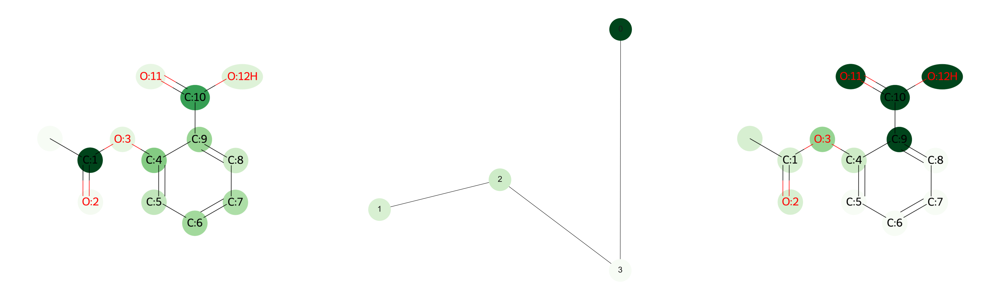

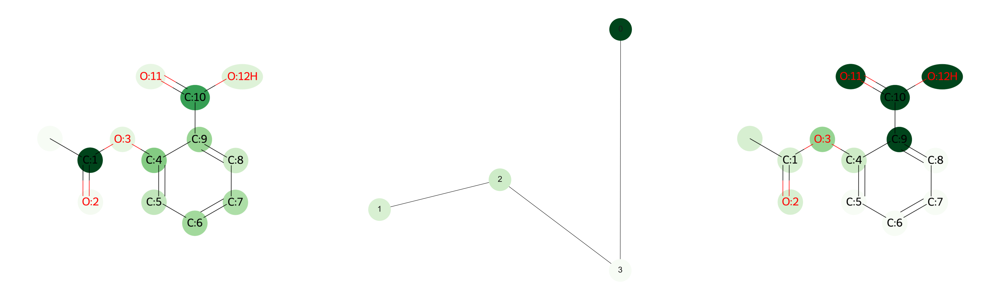

In [14]:
plot_attentions(args, sample_graph, sample_att)

[13:49:42] The new font size 1 is below the current minimum (6).


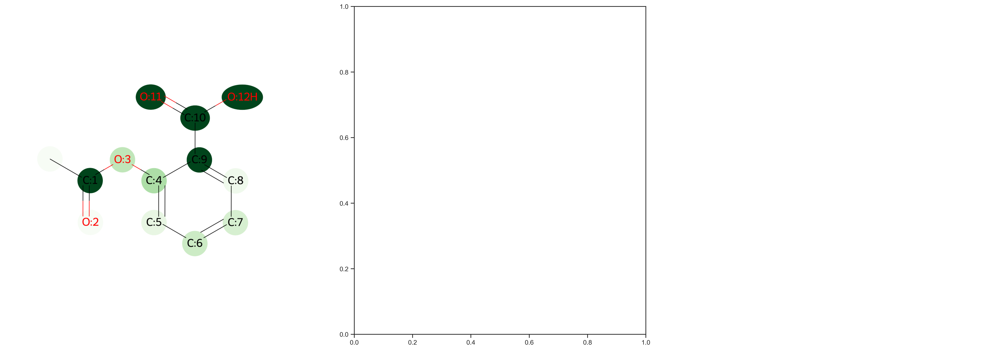

In [15]:
smiles = smiles_processes
mol = smiles_to_mol(smiles, with_atom_index=False)

# reduced graph
if args.schema in ['A']:
    reduced_graph, cliques, edges = getReducedGraph(args, ['atom'], smiles, normalize=False)
else:
    reduced_graph, cliques, edges = getReducedGraph(args, args.reduced, smiles, normalize=False)

sample_att_g, sample_att_r = sample_att
if args.schema in ['A', 'R_N', 'AR', 'AR_0', 'AR_N']:
    mask_graph_g = mask_graph(sample_att_g)
if args.schema in ['R', 'R_0', 'R_N', 'AR', 'AR_0', 'AR_N']:
    mask_graph_r = mask_reduced(sample_att_r)   
if not args.schema in ['A']:
    mask_graph_x = mask_rtog(smiles, cliques, mask_graph_r)
    if args.schema in ['AR', 'AR_0', 'AR_N']:
        mask_graph_x = mask_gandr(mask_graph_g, mask_graph_x)
        display_interpret_weight(mol, None, None, mask_graph_x, None, scale=True)

## Test Compound

In [16]:
from locale import normalize
from rdkit import Chem
smiles = sample_graph.smiles
mol = Chem.MolFromSmiles(smiles)

if args.schema in ['A']:
    reduced_graph, cliques, edges = getReducedGraph(args, ['atom'], smiles, normalize=False)
else:
    reduced_graph, cliques, edges = getReducedGraph(args, args.reduced, smiles, normalize=False)
# print(reduced_graph.node_features)

sample_att_g, sample_att_r = sample_att
if args.schema in ['A', 'R_N', 'AR', 'AR_0', 'AR_N']:
    mask_graph_g = mask_graph(sample_att_g)
if args.schema in ['R', 'R_0', 'R_N', 'AR', 'AR_0', 'AR_N']:
    mask_graph_r = mask_reduced(sample_att_r)

In [17]:
if args.schema in ['A']:
    feature_importance = dict()
    for i, f in enumerate(reduced_graph.node_features):
        f_tuple = tuple(f)
        if f_tuple in feature_importance:
            feature_importance[f_tuple].append(mask_graph_g['atom'][i])
        else:
            feature_importance[f_tuple] = [mask_graph_g['atom'][i]]
elif args.schema in ['R', 'R_0', 'R_N', 'AR', 'AR_0', 'AR_N']:
    feature_importance = dict()
    for i, f in enumerate(reduced_graph.node_features):
        f_tuple = tuple(f)
        if f_tuple in feature_importance:
            feature_importance[f_tuple].append(mask_graph_r['atom'][i])
        else:
            feature_importance[f_tuple] = [mask_graph_r['atom'][i]]

In [18]:
# feature_importance

## Running

In [19]:
all_dataset = datasets_graph
print('Number of dataset:', len(all_dataset))

Number of dataset: 1965


In [20]:
att_dist = []

list_features = list()
feature_importance_all_value =  dict()
feature_importance_all_smiles = dict()
feature_max = dict()
feature_topk = dict()
feature_05 = dict()
feature_outlier = dict()
feature_score = dict()
truevalue = dict()

count = 0 
tester = Tester(args, args_test)

b = False
count_outlier = 0

for d in tqdm(all_dataset):
    # data loader
    test_loader, datasets_test =  generateDataLoaderListing([all_dataset[d]], 1)
    molecule_test = datasets_test[0]

    # testing
    # print(datasets_test)
    try:
        predicted = tester.test_single(test_loader, return_attention_weights=True, print_result=False)
    except:
        predicted = None

    # if predicted != molecule_test.y:
    #     print(molecule_test.smiles, "TRUE:", molecule_test.y, "PREDICTED:", predicted)

    if predicted is not None:
        # print(predicted)
        try:
            predicted = predicted.item()
        except:
            predicted = predicted[0][0]

        if predicted not in feature_importance_all_value:
            feature_importance_all_smiles[predicted] = dict()
            feature_importance_all_value[predicted] = dict()
            feature_max[predicted] = dict()
            feature_topk[predicted] = dict()
            feature_05[predicted] = dict()
            feature_outlier[predicted] = dict()
            feature_score[predicted] = dict()

        count += 1

        # attention result
        att_mol = tester.getAttentionMol()
        sample_att = att_mol
        sample_graph = molecule_test
        if 'atom' in sample_att:
            sample_att_g = sample_att['atom']
        else:
            sample_att_g = None
        if len(args.reduced) != 0:
            sample_att_r = sample_att[args.reduced[0]]
        else:
            sample_att_r = None
        # sample_att_g, sample_att_r = sample_att
        if args.schema in ['A', 'R_N', 'AR', 'AR_0', 'AR_N']:
            mask_graph_g = mask_graph(sample_att_g)
        if args.schema in ['R', 'R_0', 'R_N', 'AR', 'AR_0', 'AR_N']:
            mask_graph_r = mask_reduced(sample_att_r)

        # molecule
        smiles = sample_graph.smiles
        mol = Chem.MolFromSmiles(smiles)

        # record importance
        mask_graph_x = None

        # if args.schema in ['A']:
        if 'A' in args.schema:
            mask_graph_x = mask_graph_g

            # reduced graph
            reduced_graph, cliques, edges = getReducedGraph(args, ['atom'], smiles, normalize=False)

            # finding outlier
            q3, q1 = np.percentile(list(mask_graph_x['atom'].values()), [75, 25])
            iqr = q3 - q1
            outlier = q3 + 1.5*iqr
            # finding top-k (25%)
            k = 0.25
            topk_position = len(list(mask_graph_x['atom'].values()))*0.25
            topk_sorted = sorted(list(mask_graph_x['atom'].values()), reverse=True)
            topk_ceil = math.ceil(topk_position)
            if len(list(mask_graph_x['atom'].values())) == 1:
                topk_ceil = 0
            topk = topk_sorted[topk_ceil]
            # finding max
            f_max = None
            f_max_value = 0
            # average
            f_average = np.mean(list(mask_graph_x['atom'].values()))

            for i, f in enumerate(reduced_graph.node_features):
                f_tuple = getImportanceFeatures(['atom'], f)
                # if len(args.reduced) == 0:
                #     f_tuple = getImportanceFeatures(['atom'], f)
                # elif 'substructure' not in args.reduced:
                #     f_tuple = getImportanceFeatures(args.reduced, f)
                # else:
                #     f_tuple = getImportanceFeatures(args.reduced, reduced_graph.cliques_smiles[i])
                list_features.append(f_tuple)

                # all
                if f_tuple in feature_importance_all_value[predicted]:
                    feature_importance_all_value[predicted][f_tuple].append(mask_graph_x['atom'][i])
                    feature_importance_all_smiles[predicted][f_tuple].append(smiles)
                else:
                    feature_importance_all_value[predicted][f_tuple] = [mask_graph_x['atom'][i]]
                    feature_importance_all_smiles[predicted][f_tuple] = [smiles]
                # max
                if mask_graph_x['atom'][i] > f_max_value:
                    f_max_value = mask_graph_x['atom'][i]
                    f_max = f_tuple
                # topk
                if mask_graph_x['atom'][i] >= topk and topk != 0:
                    if f_tuple in feature_topk[predicted]:
                        feature_topk[predicted][f_tuple].append(smiles)
                    else:
                        feature_topk[predicted][f_tuple] = [smiles]
                # 05
                if mask_graph_x['atom'][i] >= 0.5:
                    if f_tuple in feature_05[predicted]:
                        feature_05[predicted][f_tuple].append(smiles)
                    else:
                        feature_05[predicted][f_tuple] = [smiles]
                # outlier
                if mask_graph_x['atom'][i] >= outlier and outlier != 0:
                    if f_tuple in feature_outlier[predicted]:
                        feature_outlier[predicted][f_tuple].append(smiles)
                    else:
                        feature_outlier[predicted][f_tuple] = [smiles]
                # score
                if f_tuple in feature_score[predicted]:
                    feature_score[predicted][f_tuple].append(mask_graph_x['atom'][i]-f_average)
                else:
                    feature_score[predicted][f_tuple] = [mask_graph_x['atom'][i]-f_average]


            # if predicted == 1 or args.graphtask == 'regression':
            # if predicted[0] >= 3.0: #lipo
            # max
            if f_max in feature_max[predicted]:
                feature_max[predicted][f_max].append(smiles)
            else:
                feature_max[predicted][f_max] = [smiles]

        # elif args.schema in ['R', 'R_0', 'R_N', 'AR', 'AR_0', 'AR_N']:
        if 'R' in args.schema:
            mask_graph_x = mask_graph_r

            # reduced graph
            reduced_graph, cliques, edges = getReducedGraph(args, args.reduced, smiles, normalize=False)

            # finding outlier
            q3, q1 = np.percentile(list(mask_graph_x['atom'].values()), [75, 25])
            iqr = q3 - q1
            outlier = q3 + 1.5*iqr
            # finding top-k (25%)
            k = 0.25
            topk_position = len(list(mask_graph_x['atom'].values()))*0.25
            topk_sorted = sorted(list(mask_graph_x['atom'].values()), reverse=True)
            topk_ceil = math.ceil(topk_position)
            if len(list(mask_graph_x['atom'].values())) == 1:
                topk_ceil = 0
            topk = topk_sorted[topk_ceil]
            # finding max
            f_max = None
            f_max_value = 0
            # average
            f_average = np.mean(list(mask_graph_x['atom'].values()))

            for i, f in enumerate(reduced_graph.node_features):
                if len(args.reduced) == 0:
                    f_tuple = getImportanceFeatures(['atom'], f)
                elif 'substructure' not in args.reduced:
                    f_tuple = getImportanceFeatures(args.reduced, f)
                else:
                    f_tuple = getImportanceFeatures(args.reduced, reduced_graph.cliques_smiles[i])

                list_features.append(f_tuple)

                # dist
                att_dist.extend([mask_graph_x['atom'][i]])

                # all
                if f_tuple in feature_importance_all_value[predicted]:
                    feature_importance_all_value[predicted][f_tuple].append(mask_graph_x['atom'][i])
                    feature_importance_all_smiles[predicted][f_tuple].append(smiles)
                else:
                    feature_importance_all_value[predicted][f_tuple] = [mask_graph_x['atom'][i]]
                    feature_importance_all_smiles[predicted][f_tuple] = [smiles]
                # max
                if mask_graph_x['atom'][i] > f_max_value:
                    f_max_value = mask_graph_x['atom'][i]
                    f_max = f_tuple
                # topk
                if mask_graph_x['atom'][i] >= topk and topk != 0:
                    if f_tuple in feature_topk[predicted]:
                        feature_topk[predicted][f_tuple].append(smiles)
                    else:
                        feature_topk[predicted][f_tuple] = [smiles]
                # topk
                if mask_graph_x['atom'][i] >= 0.5 and topk != 0:
                    if f_tuple in feature_05[predicted]:
                        feature_05[predicted][f_tuple].append(smiles)
                    else:
                        feature_05[predicted][f_tuple] = [smiles]
                # outlier
                if mask_graph_x['atom'][i] >= outlier and outlier != 0:
                    if f_tuple in feature_outlier[predicted]:
                        feature_outlier[predicted][f_tuple].append(smiles)
                    else:
                        feature_outlier[predicted][f_tuple] = [smiles]
                # score
                if f_tuple in feature_score[predicted]:
                    feature_score[predicted][f_tuple].append(mask_graph_x['atom'][i]-f_average)
                else:
                    feature_score[predicted][f_tuple] = [mask_graph_x['atom'][i]-f_average]
                

            # if predicted == 1 or args.graphtask == 'regression':
            # if predicted[0] >= 3.0: #lipo
            # max
            if f_max in feature_max[predicted]:
                feature_max[predicted][f_max].append(smiles)
            else:
                feature_max[predicted][f_max] = [smiles]

        # if not args.schema in ['A']:
        #     mask_graph_x = mask_rtog(smiles, cliques, mask_graph_r)
        #     if args.schema in ['AR', 'AR_0', 'AR_N']:
        #         mask_graph_x = mask_gandr(mask_graph_g, mask_graph_x)
        #         # display_interpret_weight(mol, None, None, mask_graph_x, None, scale=True)

GNN_Combine(
  (node_feature_graph): NodeLinear(
    (lin1): Linear(in_features=79, out_features=256, bias=True)
    (bn): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (edge_feature_graph): EdgeLinear(
    (lin1): Linear(in_features=10, out_features=32, bias=True)
    (bn): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (GNN_Graph): GNN_Graph(
    (convs): ModuleList(
      (0): GINEConv(nn=Sequential(
        (0): GIN_Sequential(
          (lin1): Linear(in_features=256, out_features=256, bias=True)
          (bn1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (leakyrelu1): LeakyReLU(negative_slope=0.01)
          (lin2): Linear(in_features=256, out_features=256, bias=True)
        )
      ))
      (1): GINEConv(nn=Sequential(
        (0): GIN_Sequential(
          (lin1): Linear(in_features=256, out_features=256, bias=True)
          (bn1): BatchNorm1d(256, e

  5%|▌         | 100/1965 [00:19<05:30,  5.64it/s][13:50:05] WARNING: not removing hydrogen atom without neighbors
[13:50:05] WARNING: not removing hydrogen atom without neighbors
[13:50:05] WARNING: not removing hydrogen atom without neighbors
[13:50:05] WARNING: not removing hydrogen atom without neighbors
[13:50:05] WARNING: not removing hydrogen atom without neighbors
[13:50:05] WARNING: not removing hydrogen atom without neighbors
[13:50:05] WARNING: not removing hydrogen atom without neighbors
[13:50:05] WARNING: not removing hydrogen atom without neighbors
[13:50:05] WARNING: not removing hydrogen atom without neighbors
  6%|▌         | 114/1965 [00:22<06:04,  5.07it/s][13:50:08] WARNING: not removing hydrogen atom without neighbors
[13:50:08] WARNING: not removing hydrogen atom without neighbors
[13:50:08] WARNING: not removing hydrogen atom without neighbors
[13:50:08] WARNING: not removing hydrogen atom without neighbors
[13:50:08] WARNING: not removing hydrogen atom without 

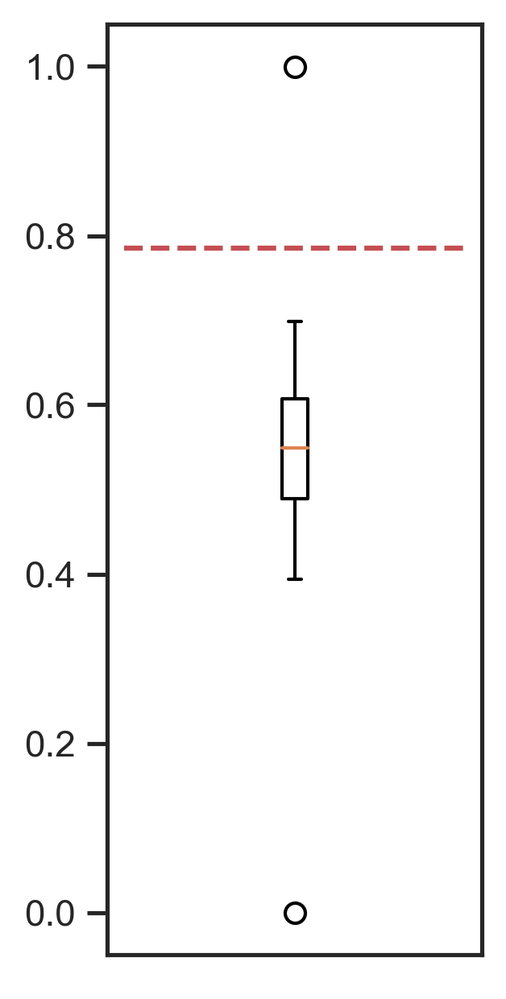

In [21]:
boxplot_data = list(mask_graph_x['atom'].values())
fig = plt.figure(figsize =(2, 5))
# Creating plot
plt.boxplot(boxplot_data)
plt.plot([0, 2], [outlier, outlier], 'r--')
#get current axes
ax = plt.gca()
#hide y-axis
ax.get_xaxis().set_visible(False)
# show plot
plt.show()

23412


Text(0.5, 0, 'spearmanr')

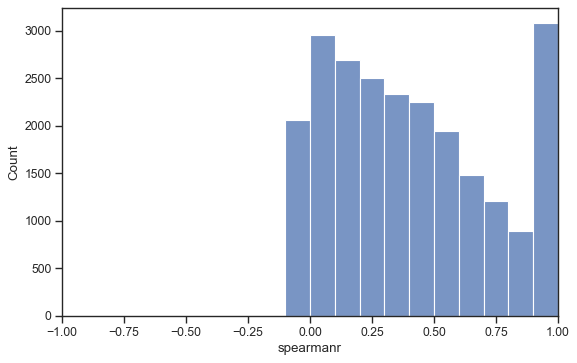

In [22]:
print(len(att_dist))
from matplotlib.pyplot import figure
figure(figsize=(8, 5), dpi=80)
fig = sns.histplot(data=att_dist, bins=np.arange(-1.1, 1.1, 0.1))
fig.set_xlim([-1,1])
plt.xlabel('spearmanr')

In [23]:
def getScoreDict(set_features, score_feature):
    dict_temp = {0: list(), 1: list()}
    for p in range(2):
        for f in set_features:
            if f in score_feature[p]:
                dict_temp[p].append(len(set(score_feature[p][f])))
            else:
                dict_temp[p].append(0)
    return dict_temp

In [24]:
set_features = list(set(list_features))
if args.graphtask == 'classification':
    dict_all = getScoreDict(set_features, feature_importance_all_smiles)
    dict_max = getScoreDict(set_features, feature_max)
    dict_top = getScoreDict(set_features, feature_topk)
    dict_05 = getScoreDict(set_features, feature_05)
    dict_out = getScoreDict(set_features, feature_outlier)


In [25]:
if args.graphtask == 'classification':
    # dict of values (ordered by list of features)
    score_all = dict_all
    score_max = dict_max
    score_top = dict_top
    score_05 = dict_05
    score_out = dict_out
    # list of features
    labels = [str(s) for s in set_features]

    df_dict = dict()
    for p in range(2):
        df_dict[p] = pd.DataFrame(data={'featurenode': labels,
                                        'all': score_all[p],
                                        'top25': score_top[p],
                                        '0.5': score_05[p],
                                        'max': score_max[p],
                                        'out': score_out[p]})
        df_dict[p] = pd.melt(df_dict[p], id_vars=['featurenode'], value_vars=['all', 'top25', '0.5', 'max', 'out'], var_name='type', value_name='smiles')

    fig, axes = plt.subplots(1,2 , figsize=(20, len(labels)), sharey=True)

    for p in range(2):
        ti = sns.barplot(data=df_dict[p], y='featurenode', x='smiles', ax=axes[p], orient='h', hue='type')
        ti.set_yticklabels(labels, ha="center", position=(1.15,0)) # ha and position adjustments.
        ti.yaxis.grid(False)
        ti.xaxis.grid(True)
        ti.set(ylabel=None)
        if p == 0:
            ti.invert_xaxis()
            ti.yaxis.tick_right()
            ti.set_xlim([len(all_dataset), 0])
            ti.legend(loc='upper left')
        else:
            ti.set_xlim([0, len(all_dataset)])
            ti.legend(loc='upper right')

    plt.tight_layout(w_pad=5, pad=2) # Some padding adjustments.
    plt.show()

In [26]:
if args.graphtask == 'classification':
    predicted = 1
    df_featurename = list()
    df_featurescore = list()
    for i in feature_score[predicted]:
        sum_score = np.sum(feature_score[predicted][i])
        score = sum_score/len(feature_score[predicted][i])
        df_featurename.append(i)
        df_featurescore.append(score)
    df_score = pd.DataFrame({'featurenode': df_featurename, 'score': df_featurescore})
    display(df_score.sort_values(by='score', ascending=False))

,featurenode,score
88,[f] -NHSO2CH3,0.786095
12,[f] -NO2,0.718199
83,[f] -SO2CH3,0.675637
84,[f] O-N,0.581899
54,[f] -C(=O)O,0.549401
...,...,...
45,[f] n1cnccc1,-0.408477
63,[f] n1cnccc1_atom,-0.435175
102,[f] ring_9,-0.502558
82,[f] ring_8,-0.507805


In [27]:
# if args.graphtask == 'classification':
dict_val = dict()
for p in feature_importance_all_value:
    if p not in dict_val:
        dict_val[p] = dict()
    for f in set_features:
        if f in feature_importance_all_value[p]:
            dict_val[p][f] = feature_importance_all_value[p][f]
        else:
            # dict_val[p][f] = [np.nan]
            continue
# dict_val

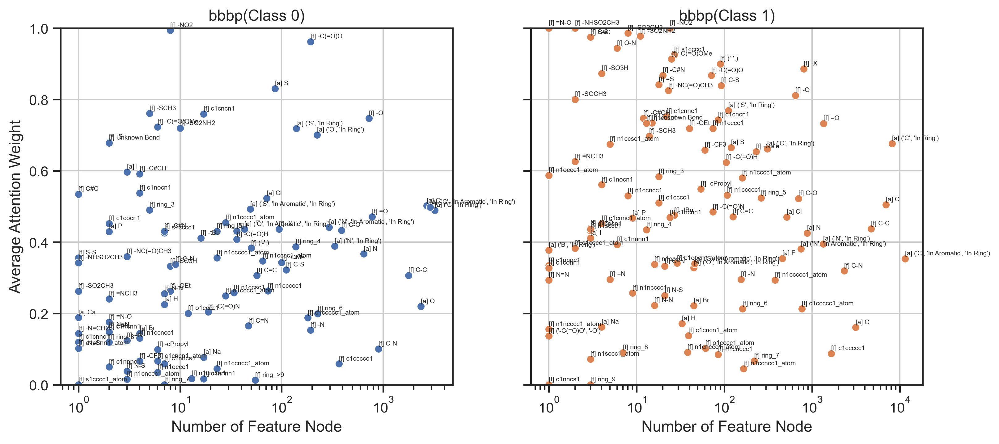

In [29]:
if args.graphtask == 'classification':

    def flatten(l):
        return [item for sublist in l for item in sublist]

    df_dict = dict()
    for p in range(2):
        df_dict[p] = pd.DataFrame(data={'featurenode': [str(v) for v in dict_val[p]],
                                        'average': [np.average(dict_val[p][v]) for v in dict_val[p]],
                                        'std': [np.std(dict_val[p][v]) for v in dict_val[p]],
                                        'amount': [len(dict_val[p][v]) for v in dict_val[p]]})
        df_dict[p]['predicted'] = p

    def label_point(x, y, val, ax):
        for xi, yi, vali in zip(x, y, val):
            ax.text(xi, yi+.01, str(vali), fontsize=5)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

    for p in range(2):
        # Only Positive
        df_dataframe = df_dict[p]
        df_featurenode = list(df_dict[p]['featurenode'])
        df_average = list(df_dict[p]['average'])
        df_amount = list(df_dict[p]['amount'])

        # method I: plt
        # fig = plt.figure(figsize=(5, 5), dpi=150)
        ax = sns.scatterplot(data=df_dataframe, x='amount', y='average', ax=axes[p], color=sns.color_palette()[p])
        label_point(df_amount, df_average, df_featurenode, ax)
        ax.yaxis.grid(True)
        ax.xaxis.grid(True)
        ax.set_ylim([0, 1])
        ax.set(title=file+'(Class '+str(p)+')')
        ax.set(xscale="log")
        ax.set(ylabel='Average Attention Weight')
        ax.set(xlabel='Number of Feature Node')
    plt.show()

In [30]:
if args.graphtask == 'regression' and file == 'aqsoldb':

    def flatten(l):
        return [item for sublist in l for item in sublist]
        
    dict_val_new = {1: dict(), # aqsoldb > -2 
                    0: dict()} # aqsoldb <= -2 

    for logs in dict_val:
        if logs > -2:
            for f in dict_val[logs]:
                if dict_val[logs][f][0] is not np.nan:
                    cleanedList = [x for x in dict_val[logs][f] if x is not np.nan]
                    if f in dict_val_new[1]:
                        dict_val_new[1][f].extend(cleanedList)
                    else:
                        dict_val_new[1][f] = cleanedList
        else:
            for f in dict_val[logs]:
                if dict_val[logs][f][0] is not np.nan:
                    cleanedList = [x for x in dict_val[logs][f] if x is not np.nan]
                    if f in dict_val_new[0]:
                        dict_val_new[0][f].extend(cleanedList)
                    else:
                        dict_val_new[0][f] = cleanedList
        # break

    print(len(dict_val_new[1]))

    df_dict = dict()
    for p in range(2):
        df_dict[p] = pd.DataFrame(data={'featurenode': [str(v) for v in dict_val_new[p]],
                                        'average': [np.average(dict_val_new[p][v]) for v in dict_val_new[p]],
                                        'std': [np.std(dict_val_new[p][v]) for v in dict_val_new[p]],
                                        'amount': [len(dict_val_new[p][v]) for v in dict_val_new[p]]})
        df_dict[p]['predicted'] = p

    def label_point(x, y, val, ax):
        for xi, yi, vali in zip(x, y, val):
            ax.text(xi, yi+.01, str(vali), fontsize=5)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    for p in [1]:
        # Only Positive
        df_dataframe = df_dict[p]
        df_featurenode = list(df_dict[p]['featurenode'])

        df_feat_type = []
        df_feat_name = []
        df_color = []
        for feat in df_featurenode:
            df_feat_type.append(0 if feat[:3] == '[a]' else 1)
            df_color.append('tab:orange' if feat[:3] == '[a]' else 'tab:blue')
            df_feat_name.append(feat[3:])

        df_average = list(df_dict[p]['average'])
        df_amount = list(df_dict[p]['amount'])
        yerr = list(df_dict[p]['std'])

        # method I: plt
        # fig = plt.figure(figsize=(5, 5), dpi=150)
        # ax = sns.scatterplot(data=df_dataframe, x='amount', y='average', ax=axes[p], color=sns.color_palette()[p])
        plt.errorbar(df_amount, df_average, yerr=yerr, linestyle="None", ecolor='lightgray', elinewidth=1, capsize=1, zorder=1)
        ax = sns.scatterplot(data=df_dataframe, x='amount', y='average', ax=axes[p], c=df_color, alpha=0.8)
        label_point(df_amount, df_average, df_feat_name, ax)
        ax.yaxis.grid(True)
        ax.xaxis.grid(True)
        ax.set_ylim([-0.1, 1.1])
        ax.grid(alpha=0.2)
        ax.set(title=file+' (Class '+str(p)+')')
        ax.set(xscale="log")
        ax.set(ylabel='Average Attention Weight')
        ax.set(xlabel='Number of Feature Node')
    plt.show()

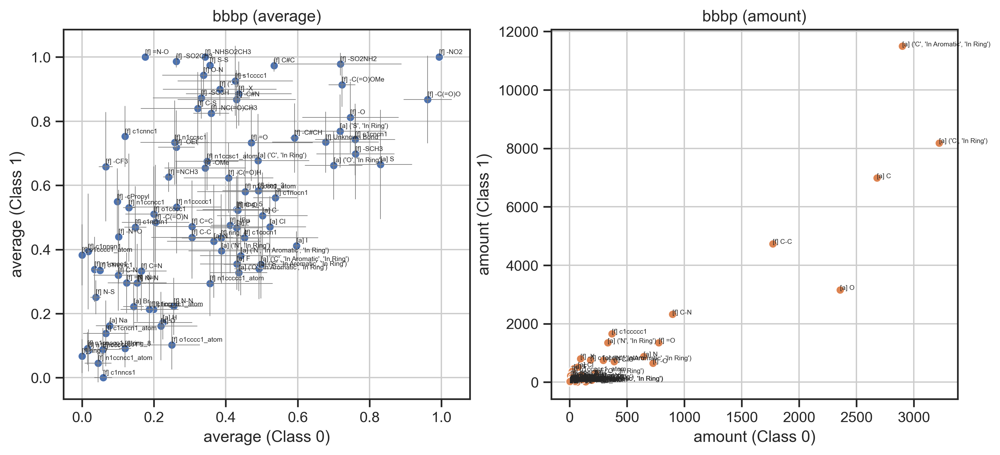

In [31]:
if args.graphtask == 'classification':

    def flatten(l):
        return [item for sublist in l for item in sublist]

    df_dict = dict()
    for p in range(2):
        df_dict[p] = pd.DataFrame(data={'featurenode': [str(v) for v in dict_val[p]],
                                        'average': [np.average(dict_val[p][v]) for v in dict_val[p]],
                                        'std': [np.std(dict_val[p][v]) for v in dict_val[p]],
                                        'amount': [len(dict_val[p][v]) for v in dict_val[p]]})
        df_dict[p]['predicted'] = p

    def label_point(x, y, val, ax, error_x=None, error_y=None):
        for i in range(len(x)):
            ax.text(x[i], y[i]+.01, str(val[i]), fontsize=5)
            if error_x is not None:
                ax.plot([x[i]+(error_x[i]/2), x[i]-(error_x[i]/2)], [y[i], y[i]], linewidth=.5, color='gray')
            if error_y is not None:  
                ax.plot([x[i], x[i]], [y[i]+(error_y[i]/2), y[i]-(error_y[i]/2)], linewidth=.5, color='gray')

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    for pi, p in enumerate(['average', 'amount']):
        # Only Positive
        df_dataframe = df_dict[1].merge(df_dict[0], on='featurenode', suffixes=('_1', '_0'))
        df_featurenode = list(df_dataframe['featurenode'])
        df_0 = list(df_dataframe[p+'_0'])
        df_1 = list(df_dataframe[p+'_1'])

        # method I: plt
        ax = sns.scatterplot(data=df_dataframe, x=p+'_0', y=p+'_1', ax=axes[pi], color=sns.color_palette()[pi])
        label_point(df_0, df_1, df_featurenode, ax, error_x=list(df_dataframe['std_0']), error_y=list(df_dataframe['std_1']))
        ax.yaxis.grid(True)
        ax.xaxis.grid(True)
        ax.set(title=file+' ('+str(p)+')')
        ax.set(xlabel=str(p)+' (Class 0)')
        ax.set(ylabel=str(p)+' (Class 1)')
    plt.show()

In [32]:
# if args.graphtask == 'classification':
dict_val = dict()
for p in feature_importance_all_value:
    if p not in dict_val:
        dict_val[p] = dict()
    for f in set_features:
        if f in feature_importance_all_value[p]:
            dict_val[p][f] = feature_importance_all_value[p][f]
        else:
            dict_val[p][f] = [np.nan]
            # continue
# dict_val

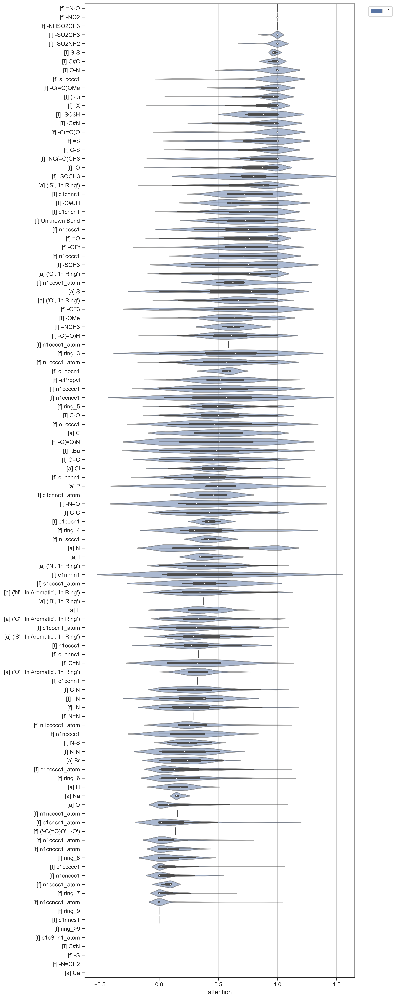

In [33]:
if args.graphtask == 'classification':
    dict_val_new = dict_val

if args.graphtask == 'regression' and file == 't02_aqsoldb_9982':
    
    dict_val_new = {1: dict(), # aqsoldb > -2
                    0: dict()} # aqsoldb <= -2

    for logs in dict_val:
        if logs > -2:
            for f in dict_val[logs]:
                if dict_val[logs][f][0] is not np.nan:
                    cleanedList = [x for x in dict_val[logs][f] if x is not np.nan]
                    if f in dict_val_new[1]:
                        dict_val_new[1][f].extend(cleanedList)
                    else:
                        dict_val_new[1][f] = cleanedList
        else:
            for f in dict_val[logs]:
                if dict_val[logs][f][0] is not np.nan:
                    cleanedList = [x for x in dict_val[logs][f] if x is not np.nan]
                    if f in dict_val_new[0]:
                        dict_val_new[0][f].extend(cleanedList)
                    else:
                        dict_val_new[0][f] = cleanedList
        # break

    print(len(dict_val_new[1]))

def flatten(l):
    return [item for sublist in l for item in sublist]

df_dict = dict()
for p in range(2):
    df_dict[p] = pd.DataFrame(data={'featurenode': flatten([[str(v)]*len(dict_val_new[p][v]) for v in dict_val_new[p]]),
                                    'attention': flatten([dict_val_new[p][v] for v in dict_val_new[p]]),
                                    'average': flatten([[np.average(dict_val_new[p][v])]*len(dict_val_new[p][v]) for v in dict_val_new[p]])})
    df_dict[p]['predicted'] = p

# Only Positive
df_concat = df_dict[1].sort_values(by=['average', 'featurenode'], ascending=False)

fig, axes = plt.subplots(1, 1, figsize=(10, len(labels)//4), sharey=True)
ti = sns.violinplot(data=df_concat, x="attention", y="featurenode", hue='predicted')
for violin in ti.collections[::2]:
    violin.set_alpha(0.5)
# ti = sns.boxplot(data=df_concat, x='attention', y='featurenode', zorder=1, hue='predicted', dodge=True, jitter=False)
ti.yaxis.grid(False)
ti.xaxis.grid(True)
ti.set(ylabel=None)
plt.tight_layout(w_pad=5, pad=2) # Some padding adjustments.
plt.legend(loc='best', bbox_to_anchor=(0.75, 0.55, 0.4, 0.45))
plt.show()

In [34]:
if args.graphtask == 'classification':
    dict_val_new = dict_val

if args.graphtask == 'regression':

    def flatten(l):
        return [item for sublist in l for item in sublist]
    
    dict_val_new = {1: dict(), # aqsoldb > -2
                    0: dict()} # aqsoldb <= -2

    for logs in dict_val:
        if logs > -2:
            for f in dict_val[logs]:
                if dict_val[logs][f][0] is not np.nan:
                    cleanedList = [x for x in dict_val[logs][f] if x is not np.nan]
                    if f in dict_val_new[1]:
                        dict_val_new[1][f].extend(cleanedList)
                    else:
                        dict_val_new[1][f] = cleanedList
        else:
            for f in dict_val[logs]:
                if dict_val[logs][f][0] is not np.nan:
                    cleanedList = [x for x in dict_val[logs][f] if x is not np.nan]
                    if f in dict_val_new[0]:
                        dict_val_new[0][f].extend(cleanedList)
                    else:
                        dict_val_new[0][f] = cleanedList
        # break

    print(len(dict_val_new[1]))

if args.graphtask == 'classification' or file == 't02_aqsoldb_9982':

    def flatten(l):
        return [item for sublist in l for item in sublist]

    df_dict = dict()
    for p in range(2):
        df_dict[p] = pd.DataFrame(data={'featurenode': flatten([[str(v)]*len(dict_val_new[p][v]) for v in dict_val_new[p]]),
                                        'attention': flatten([dict_val_new[p][v] for v in dict_val_new[p]])})
        df_dict[p]['predicted'] = p

    df_concat = pd.concat([df_dict[0], df_dict[1]])

    fig, axes = plt.subplots(1, 1, figsize=(10, len(labels)//2), sharey=True)
    ti = sns.violinplot(data=df_concat, x="attention", y="featurenode", hue='predicted')
    for violin in ti.collections[::2]:
        violin.set_alpha(0.5)
    ti = sns.stripplot(data=df_concat, x='attention', y='featurenode', zorder=1, hue='predicted', dodge=True, jitter=False)
    ti.yaxis.grid(False)
    ti.xaxis.grid(True)
    ti.set(ylabel=None)
    plt.tight_layout(w_pad=5, pad=2) # Some padding adjustments.
    plt.legend(loc='best', bbox_to_anchor=(0.75, 0.55, 0.4, 0.45))
    plt.show()


In [35]:
from matplotlib.cm import ScalarMappable
if args.graphtask == 'regression':

    # list of features
    labels = [str(s) for s in set_features]

    def flatten(l):
        return [item for sublist in l for item in sublist]

    df_dict = dict()
    for p in dict_val:
        df_dict[p] = pd.DataFrame(data={'featurenode': flatten([[str(v)]*len(dict_val[p][v]) for v in dict_val[p]]),
                                        'attention': flatten([dict_val[p][v] for v in dict_val[p]])})
        df_dict[p]['predicted'] = p

    df_concat = pd.DataFrame()
    for p in df_dict:
        df_concat = pd.concat([df_concat, df_dict[p]])

    bin = np.arange(min(df_concat['predicted']), max(df_concat['predicted']))
    df_concat['bin'] = pd.cut(df_concat['predicted'], bin, precision=1)

    fig, axes = plt.subplots(1, 1, figsize=(20, len(labels)//2))

    # plt.figure()
    cpal=sns.color_palette('Spectral',n_colors=len(bin),desat=1.)
    ax = sns.stripplot(x='attention', y='featurenode', data=df_concat, 
                       jitter=0.15, edgecolor='none', alpha=0.4, size=5, hue='bin', palette=cpal)
    ax.yaxis.grid(False)
    ax.xaxis.grid(True)
    ax.set(ylabel=None)
    sns.despine()

    # This is the part about the colormap
    cmap = plt.get_cmap("Spectral")
    norm = plt.Normalize(df_concat['predicted'].min(), df_concat['predicted'].max())
    sm =  ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.ax.set_title("predicted")

    #remove the legend created by seaborn
    ax.legend_.remove()

    plt.show()

In [36]:
from matplotlib.cm import ScalarMappable
if args.graphtask == 'regression':

    # list of features
    labels = [str(s) for s in set_features]

    def flatten(l):
        return [item for sublist in l for item in sublist]

    df_dict = dict()
    for p in dict_val:
        df_dict[p] = pd.DataFrame(data={'featurenode': flatten([[str(v)]*len(dict_val[p][v]) for v in dict_val[p]]),
                                        'attention': flatten([dict_val[p][v] for v in dict_val[p]])})
        df_dict[p]['predicted'] = p

    df_concat = pd.DataFrame()
    for p in df_dict:
        df_concat = pd.concat([df_concat, df_dict[p]])

    bin = np.arange(np.nanmin(df_concat['attention']), np.nanmax(df_concat['attention']), 0.1)
    df_concat['bin'] = pd.cut(df_concat['attention'], bin, precision=1)

    fig, axes = plt.subplots(1, 1, figsize=(20, len(labels)//2))

    # plt.figure()
    # cpal=sns.color_palette('Spectral',n_colors=len(bin),desat=1.)
    cpal=sns.color_palette("Greens", n_colors=len(bin),desat=1.)
    ax = sns.stripplot(x='predicted', y='featurenode', data=df_concat, 
                       jitter=0.15, edgecolor='none', alpha=0.4, size=5, hue='bin', palette=cpal)
    ax.yaxis.grid(False)
    ax.xaxis.grid(True)
    ax.set(ylabel=None)
    sns.despine()

    # This is the part about the colormap
    # cmap = plt.get_cmap("Spectral")
    cmap = sns.color_palette("Greens", as_cmap=True)
    norm = plt.Normalize(df_concat['attention'].min(), df_concat['attention'].max())
    sm =  ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.ax.set_title("attention")

    #remove the legend created by seaborn
    ax.legend_.remove()

    plt.show()

In [37]:
if args.graphtask == 'classification':
    fig, axes = plt.subplots(1, 2, figsize=(20, len(labels)//2), sharey=True)

    for p in range(2):
        # ti = sns.violinplot(data=df_dict[p], x="attention", y="y", ax=axes[p], color="0.8")
        ti = sns.stripplot(data=df_dict[p], x='attention', y='featurenode', ax=axes[p], zorder=1, s=10, alpha=.5, jitter=False)
        ti.set_yticklabels(labels, ha="center", position=(1.15, 0)) # ha and position adjustments.
        ti.yaxis.grid(False)
        ti.xaxis.grid(True)
        ti.set(ylabel=None)
        if p == 0:
            ti.invert_xaxis()
            ti.yaxis.tick_right()
            ti.set_xlim([1, 0])
            ti.legend(loc='upper left')
        else:
            ti.set_xlim([0, 1])
            ti.legend(loc='upper right')

    plt.tight_layout(w_pad=5, pad=2) # Some padding adjustments.
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Prediction: 1


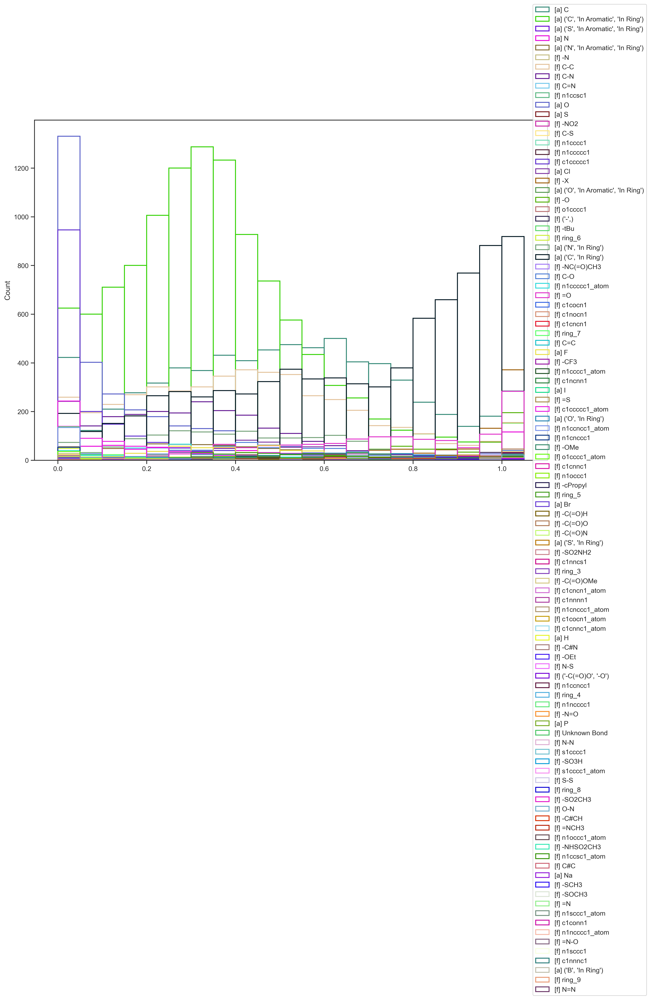

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import random

if args.graphtask == 'classification':
    predicted = 1
    print('Prediction:', predicted)
    number_of_colors = len(feature_importance_all_value[predicted])

    color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(number_of_colors)]

    plt.figure(figsize=(15,10))
    for i, f in enumerate(feature_importance_all_value[predicted]):
        # if f == ('c1ccccc1',):
        #     sns.histplot(feature_importance[f], bins=np.arange(0, 1.1, 0.05), label=f,
        #                 kde=False, legend=True, discrete=False, fill=False, color=color[i])
        #     plt.legend(loc='best')

        sns.histplot(feature_importance_all_value[predicted][f], bins=np.arange(0, 1.1, 0.05), label=f,
                    kde=False, legend=True, discrete=False, fill=False, color=color[i])
        plt.legend(loc='best', bbox_to_anchor=(0.8, 0.9, 0.4, 0.45))

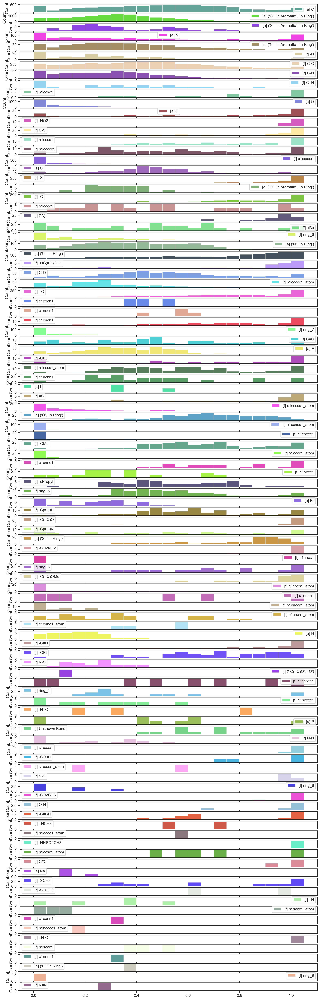

In [39]:
if args.graphtask == 'classification':
    fig, ax = plt.subplots(len(color), 1, sharex=True, figsize=(15,50))
    for i, f in enumerate(feature_importance_all_value[predicted]):
        sns.histplot(feature_importance_all_value[predicted][f], ax=ax[i], bins=np.arange(0, 1.1, 0.05), label=f,
                    kde=False, legend=True, discrete=False, fill=True, color=color[i])
        # ax[i].set_ylim([0, 1200])
        ax[i].legend()

In [40]:
if args.graphtask == 'classification':
    feature_max_sort = {f: len(feature_max[predicted][f]) for f in feature_max[predicted]}
    feature_percent_sort = {f: feature_max_sort[f]/len(feature_importance_all_value[predicted][f])*100 for f in feature_max_sort if f is not None}
    feature_percent_sort = dict(sorted(feature_percent_sort.items(), key=lambda item: item[1], reverse=True))
    f_sum = 0
    for m in feature_percent_sort:
        if m is not None:
            print(m, feature_max_sort[m], len(feature_importance_all_value[predicted][m]), str(feature_percent_sort[m])+'%')
        else:
            print(m, feature_max_sort[m])
        f_sum += feature_max_sort[m]
    print(f_sum)

[f] -NO2 24 24 100.0%
[f] -NHSO2CH3 2 2 100.0%
[f] =N-O 1 1 100.0%
[f] -SO2NH2 10 11 90.9090909090909%
[f] -SO2CH3 7 8 87.5%
[f] s1cccc1 22 27 81.48148148148148%
[f] O-N 4 6 66.66666666666666%
[f] C#C 2 3 66.66666666666666%
[f] -C(=O)O 43 71 60.56338028169014%
[f] -NC(=O)CH3 12 23 52.17391304347826%
[f] -C(=O)OMe 13 25 52.0%
[f] =S 9 18 50.0%
[f] -SO3H 2 4 50.0%
[f] -SOCH3 1 2 50.0%
[f] -X 398 804 49.50248756218906%
[f] -C#N 9 20 45.0%
[f] C-S 39 92 42.391304347826086%
[f] n1ccsc1 5 13 38.46153846153847%
[f] -O 230 649 35.43913713405239%
[f] S-S 1 3 33.33333333333333%
[f] -C#CH 4 12 33.33333333333333%
[f] ('-',) 27 90 30.0%
[f] -SCH3 4 14 28.57142857142857%
[a] S 34 120 28.333333333333332%
[f] n1cccc1 19 74 25.675675675675674%
[f] -CF3 15 60 25.0%
[f] c1cncn1 20 85 23.52941176470588%
[f] c1cnnc1 5 22 22.727272727272727%
[f] ring_3 4 18 22.22222222222222%
[f] n1ccsc1_atom 1 5 20.0%
[f] =O 244 1353 18.033998521803397%
[f] c1nnnn1 1 6 16.666666666666664%
[f] ring_4 2 13 15.384615384615385

## Summary

In [41]:
import pandas as pd
if args.graphtask == 'classification':
    pd.set_option('display.max_rows', None)
    df_outlier = pd.DataFrame(columns=['feature', '#feature_nodes_target', '#smiles_target',
    'max', '%max', 'outlier', '%outlier', 'outlier_smiles', '%outlier_smiles', 'topk', '%topk', 'topk_smiles', '%topk_smiles', '#smiles_allclasses'])
    for i, f in enumerate(feature_importance_all_smiles[predicted]):
        df_outlier.loc[i] = [f, # feature
        len(feature_importance_all_smiles[predicted][f]) if f in feature_importance_all_smiles[predicted] else 0, # number of feature nodes
        len(set(feature_importance_all_smiles[predicted][f])) if f in feature_importance_all_smiles[predicted] else 0, # number of smiles containing feature nodes (only target class)
        feature_max_sort[f] if f in feature_max_sort else 0, # number of max feature node
        feature_max_sort[f]/len(set(feature_importance_all_smiles[predicted][f]))*100 if f in feature_max_sort and f in feature_importance_all_smiles[predicted] else 0, # % of max feature node/smiles (target class) 
        len(feature_outlier[predicted][f]) if f in feature_outlier[predicted] else 0, # number of outlier feature node
        len(feature_outlier[predicted][f])/len(feature_importance_all_smiles[predicted][f])*100 if f in feature_outlier[predicted] and f in feature_importance_all_smiles[predicted] else 0, # % of outlier feature node
        len(set(feature_outlier[predicted][f])) if f in feature_outlier[predicted] else 0, # number of outlier feature node (smiles)
        len(set(feature_outlier[predicted][f]))/len(set(feature_importance_all_smiles[predicted][f]))*100 if f in feature_outlier[predicted] and f in feature_importance_all_smiles[predicted] else 0, # % of outlier feature node (smiles)
        len(feature_topk[predicted][f]) if f in feature_topk[predicted] else 0, # number of top-k feature node
        len(feature_topk[predicted][f])/len(feature_importance_all_smiles[predicted][f])*100 if f in feature_topk[predicted] and f in feature_importance_all_smiles[predicted] else 0, # % of top-k feature node
        len(set(feature_topk[predicted][f])) if f in feature_topk[predicted] else 0, # number of top-k feature node (smiles)
        len(set(feature_topk[predicted][f]))/len(set(feature_importance_all_smiles[predicted][f]))*100 if f in feature_topk[predicted] and f in feature_importance_all_smiles[predicted] else 0, # % of top-k feature node (smiles)
        len(set(feature_importance_all_smiles[predicted][f])) if f in feature_importance_all_smiles[predicted] else 0] # number of smiles containing feature nodes (all classes)
    display(df_outlier.sort_values(by='#smiles_target', ascending=False).reset_index(drop=True))

,feature,#feature_nodes_target,#smiles_target,max,%max,outlier,%outlier,outlier_smiles,%outlier_smiles,topk,%topk,topk_smiles,%topk_smiles,#smiles_allclasses
0,[a] C,6985,1458,331,22.702332,289,4.137437,200,13.717421,2707,38.754474,1095,75.102881,1458
1,[f] C-C,4733,1358,160,11.782032,31,0.654976,30,2.209131,1567,33.107965,963,70.913108,1358
2,[a] O,3156,1240,34,2.741935,14,0.443599,14,1.129032,158,5.006337,134,10.806452,1240
3,"[a] ('C', 'In Aromatic', 'In Ring')",11495,1221,166,13.595414,196,1.705089,156,12.776413,1855,16.137451,887,72.645373,1221
4,"[a] ('C', 'In Ring')",8183,1124,803,71.441281,371,4.533790,197,17.526690,4891,59.770255,1081,96.174377,1124
5,[f] c1ccccc1,1654,1103,1,0.090662,1,0.060459,1,0.090662,80,4.836759,60,5.439710,1103
6,[f] C-N,2321,1025,35,3.414634,12,0.517019,12,1.170732,442,19.043516,333,32.487805,1025
7,"[a] ('N', 'In Ring')",1346,843,3,0.355872,2,0.148588,2,0.237248,230,17.087667,223,26.453144,843
8,[f] =O,1353,837,244,29.151732,59,4.360680,50,5.973716,1061,78.418330,741,88.530466,837
9,[a] N,877,646,134,20.743034,94,10.718358,93,14.396285,296,33.751425,280,43.343653,646


In [42]:
if args.graphtask == 'classification':
    all_unique = list()
    for f in feature_outlier[predicted]:
        all_unique.extend(feature_outlier[predicted][f])
    len(set(all_unique))

In [43]:
if args.graphtask == 'classification':
    all_smiles = list()
    for f in feature_importance_all_smiles[predicted]:
        all_smiles.extend(feature_importance_all_smiles[predicted][f])
    len(set(all_smiles))